In [1]:
import os
import torch
import numpy as np
from glob import glob
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

torch.manual_seed(2025)

# Paths
orig_root = "/kaggle/input/benign-prostate-hyperplasiabph-detection/Hyperplasia Analysis"

# Define base and augmentation transforms
base_tfs = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
aug_tfs = T.Compose([
    T.RandomRotation(30),
    T.RandomResizedCrop(224, scale=(0.8, 1.0)),
    T.RandomHorizontalFlip(),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
])

class AugmentedDataset(Dataset):
    def __init__(self, root, base_transform=None, aug_transform=None,
                 target_size=2000, im_exts=[".png", ".jpg", ".jpeg", ".bmp"]):
        self.base = base_transform
        self.aug = aug_transform
        self.paths = []
        for ext in im_exts:
            self.paths.extend(glob(f"{root}/*/*{ext}"))
        self.classes = sorted({os.path.basename(os.path.dirname(p)) for p in self.paths})
        self.cls2idx = {c: i for i, c in enumerate(self.classes)}
        self.target = max(target_size, len(self.paths))

    def __len__(self):
        return self.target

    def __getitem__(self, idx):
        orig_idx = idx % len(self.paths)
        path = self.paths[orig_idx]
        img = Image.open(path).convert("RGB")
        # apply augmentation for oversampled indices
        if idx < len(self.paths):
            im = img
        else:
            im = self.aug(img)
        im = self.base(im)
        label = self.cls2idx[os.path.basename(os.path.dirname(path))]
        return im, label

# Instantiate dataset and split
dataset = AugmentedDataset(orig_root, base_transform=base_tfs,
                           aug_transform=aug_tfs, target_size=2000)
tr_len = int(len(dataset) * 0.8)
vl_len = int(len(dataset) * 0.1)
ts_len = len(dataset) - tr_len - vl_len
tr_ds, vl_ds, ts_ds = torch.utils.data.random_split(dataset, [tr_len, vl_len, ts_len])

tr_dl = DataLoader(tr_ds, batch_size=16, shuffle=True, num_workers=4)
val_dl = DataLoader(vl_ds, batch_size=16, shuffle=False, num_workers=4)
ts_dl = DataLoader(ts_ds, batch_size=1, shuffle=False, num_workers=4)

classes = dataset.cls2idx
cls_counts = {c: sum(1 for p in dataset.paths if os.path.basename(os.path.dirname(p))==c)
              for c in dataset.classes}

print("Train batches:", len(tr_dl), "Val batches:", len(val_dl), "Test batches:", len(ts_dl))
print("Classes:", classes)

Train batches: 100 Val batches: 13 Test batches: 200
Classes: {'BPH': 0, 'Normal': 1}


Data analysis is in process...



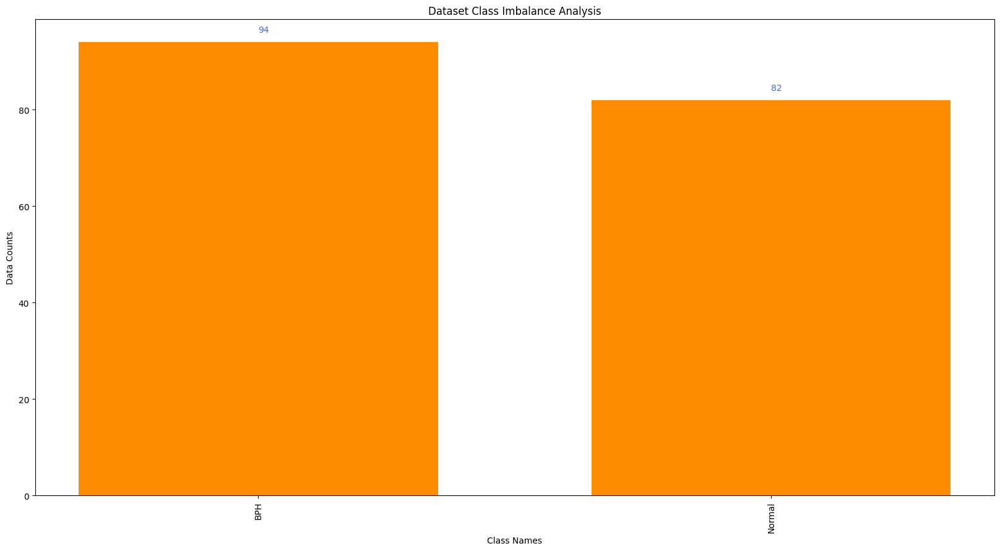

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:
    def __init__(self, vis_datas, n_ims, rows, cmap=None, cls_names=None, cls_counts=None, t_type="rgb"):
        self.n_ims, self.rows = n_ims, rows
        self.t_type, self.cmap = t_type, cmap
        self.cls_names = cls_names
        data_names = ["train", "val", "test"]
        self.vis_datas = {data_names[i]: vis_datas[i] for i in range(len(vis_datas))}
        if isinstance(cls_counts, list):
            self.analysis_datas = {data_names[i]: cls_counts[i] for i in range(len(cls_counts))}
        else:
            self.analysis_datas = {"all": cls_counts}

    def tn2np(self, t):
        gray_tfs = T.Compose([T.Normalize(mean=[0.], std=[1/0.5]), T.Normalize(mean=[-0.5], std=[1])])
        rgb_tfs = T.Compose([
            T.Normalize(mean=[0., 0., 0.], std=[1/0.229, 1/0.224, 1/0.225]),
            T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.])
        ])
        invTrans = gray_tfs if self.t_type == "gray" else rgb_tfs
        arr = invTrans(t) * 255
        arr = arr.detach().cpu().permute(1, 2, 0).numpy().astype(np.uint8)
        return arr

    def vis(self, data, save_name):
        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        cmap = "viridis" if self.cmap == "rgb" else None
        plt.figure(figsize=(25, 20))
        indices = [np.random.randint(low=0, high=len(data) - 1) for _ in range(self.n_ims)]
        for idx, index in enumerate(indices):
            im, label = data.dataset[index]
            plt.subplot(self.rows, self.n_ims // self.rows, idx + 1)
            plt.imshow(self.tn2np(im), cmap=cmap)
            plt.axis('off')
            if self.cls_names is not None:
                plt.title(f"GT -> {self.cls_names[int(label)]}")
            else:
                plt.title(f"GT -> {label}")
        plt.show()

    def data_analysis(self, cls_counts, save_name):
        print("Data analysis is in process...\n")
        names = list(cls_counts.keys())
        counts = list(cls_counts.values())
        _, ax = plt.subplots(figsize=(20, 10))
        ax.bar(np.arange(len(counts)), counts, width=0.7, color="darkorange")
        ax.set_xticks(np.arange(len(names))); ax.set_xticklabels(names, rotation=90)
        ax.set_xlabel("Class Names"); ax.set_ylabel("Data Counts"); ax.set_title("Dataset Class Imbalance Analysis")
        for i, v in enumerate(counts): ax.text(i, v + 2, str(v), color="royalblue")

    def plot_pie_chart(self, cls_counts):
        print("Generating pie chart...\n")
        labels = list(cls_counts.keys()); sizes = list(cls_counts.values())
        explode = [0.1] * len(labels)
        plt.figure(figsize=(8, 8))
        plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title("Class Distribution"); plt.axis("equal"); plt.show()

    def visualization(self): [self.vis(data.dataset, name) for name, data in self.vis_datas.items()]
    def analysis(self): [self.data_analysis(data, name) for name, data in self.analysis_datas.items()]
    def pie_chart(self): [self.plot_pie_chart(data) for data in self.analysis_datas.values()]

vis = Visualization(vis_datas=[tr_dl, val_dl, ts_dl], n_ims=18, rows=6, cmap="rgb",
                    cls_names=list(classes.keys()), cls_counts=cls_counts)
vis.analysis()

Generating pie chart...



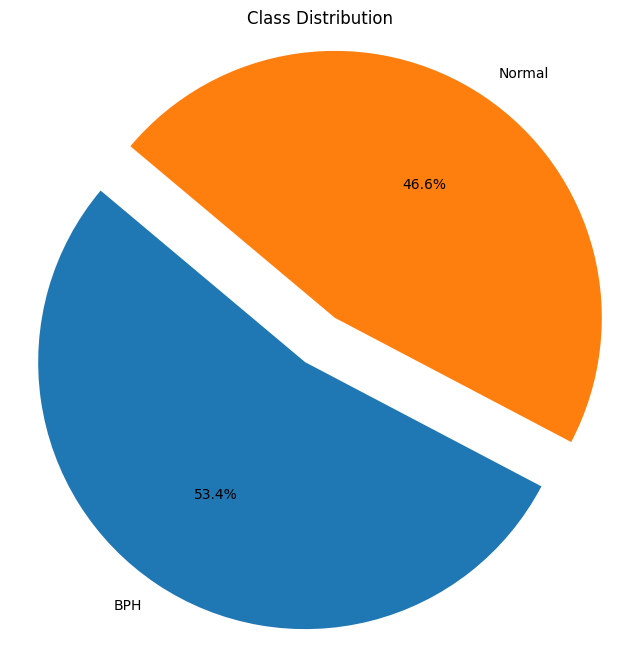

In [3]:
vis.pie_chart()

TRAIN Data Visualization is in process...



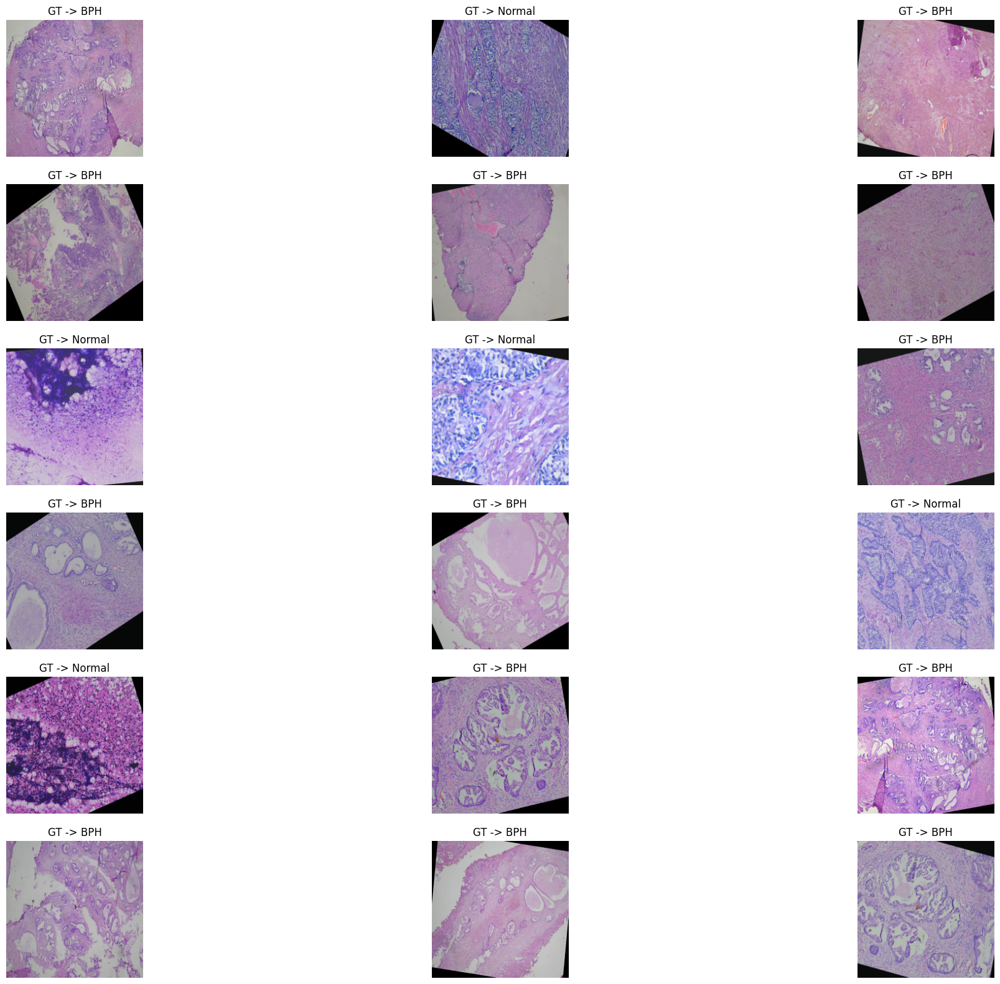

VAL Data Visualization is in process...



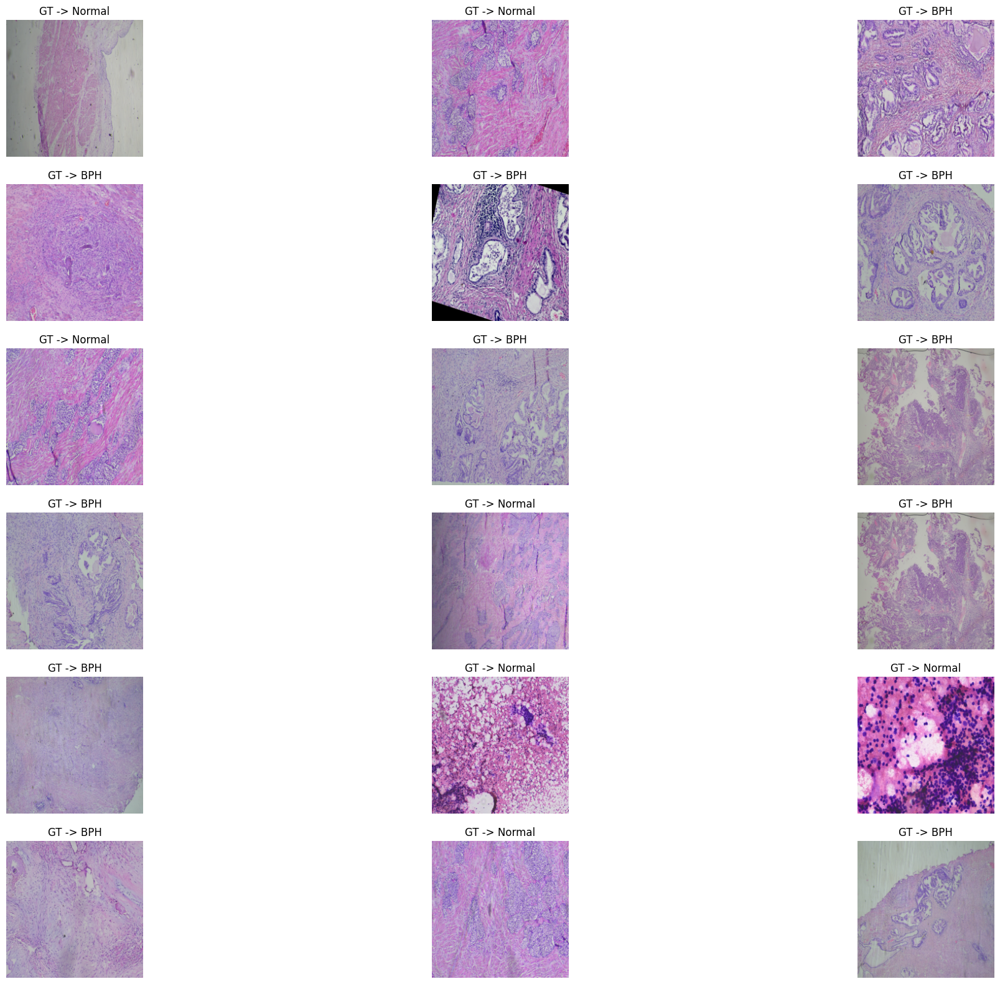

TEST Data Visualization is in process...



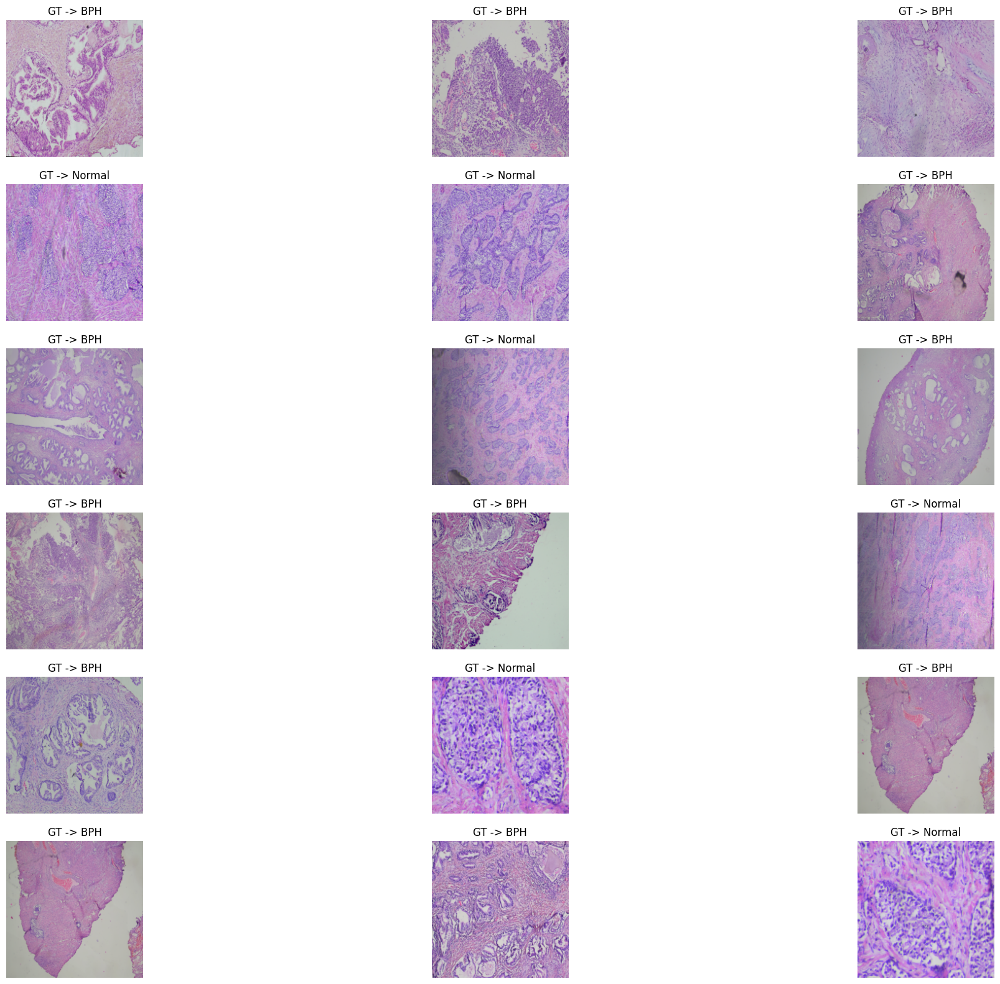

In [4]:
vis.visualization()

In [5]:
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.decomposition import PCA
# import seaborn as sns
# import pandas as pd

# class SimpleVisualization:
#     def __init__(self, dataloader, class_names):
#         self.dataloader = dataloader
#         self.class_names = class_names
    
#     def extract_features(self, model):
#         """Extract features and labels"""
#         features = []
#         labels = []
#         model.eval()
#         with torch.no_grad():
#             for imgs, gts in self.dataloader:
#                 feats = model(imgs.to(device))
#                 features.append(feats.cpu().numpy())
#                 labels.append(gts.numpy())
#         return np.vstack(features), np.hstack(labels)
    
#     def plot_2d_projection(self, features, labels):
#         """Create 2D PCA projection plot"""
#         pca = PCA(n_components=2)
#         projected = pca.fit_transform(features)
        
#         plt.figure(figsize=(10, 8))
#         scatter = sns.scatterplot(
#             x=projected[:, 0], 
#             y=projected[:, 1],
#             hue=[self.class_names[l] for l in labels],
#             palette=['blue', 'orange'],
#             alpha=0.7,
#             s=50
#         )
        
#         plt.title('2D PCA Projection: BPH vs Normal')
#         plt.xlabel('Principal Component 1')
#         plt.ylabel('Principal Component 2')
#         plt.legend(title='Classes')
#         plt.grid(True)
#         plt.savefig('/kaggle/working/2d_projection.png', dpi=300, bbox_inches='tight')
#         plt.show()
        
#         return projected
    
#     def plot_class_distribution(self, labels):
#         """Plot class distribution"""
#         class_counts = pd.Series(labels).value_counts().rename(index=self.class_names)
        
#         plt.figure(figsize=(8, 5))
#         class_counts.plot(kind='bar', color=['blue', 'orange'])
#         plt.title('Class Distribution')
#         plt.xlabel('Classes')
#         plt.ylabel('Count')
#         plt.xticks(rotation=0)
#         for i, count in enumerate(class_counts):
#             plt.text(i, count, str(count), ha='center', va='bottom')
#         plt.savefig('/kaggle/working/class_distribution.png', dpi=300, bbox_inches='tight')
#         plt.show()
    
#     def visualize(self, model):
#         """Main visualization function"""
#         print("Extracting features...")
#         features, labels = self.extract_features(model)
        
#         print("\nPlotting class distribution...")
#         self.plot_class_distribution(labels)
        
#         print("\nCreating 2D projection...")
#         self.plot_2d_projection(features, labels)

# # Initialize feature extractor
# class FeatureExtractor(torch.nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.cnn = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
#         self.cnn.fc = torch.nn.Identity()
        
#     def forward(self, x):
#         return self.cnn(x)

# # Create and run visualizations
# simple_vis = SimpleVisualization(
#     dataloader=tr_dl,  # Using training dataloader
#     class_names=['Normal', 'BPH']  # Assuming 0=Normal, 1=BPH
# )

# feature_model = FeatureExtractor().to(device)
# simple_vis.visualize(feature_model)

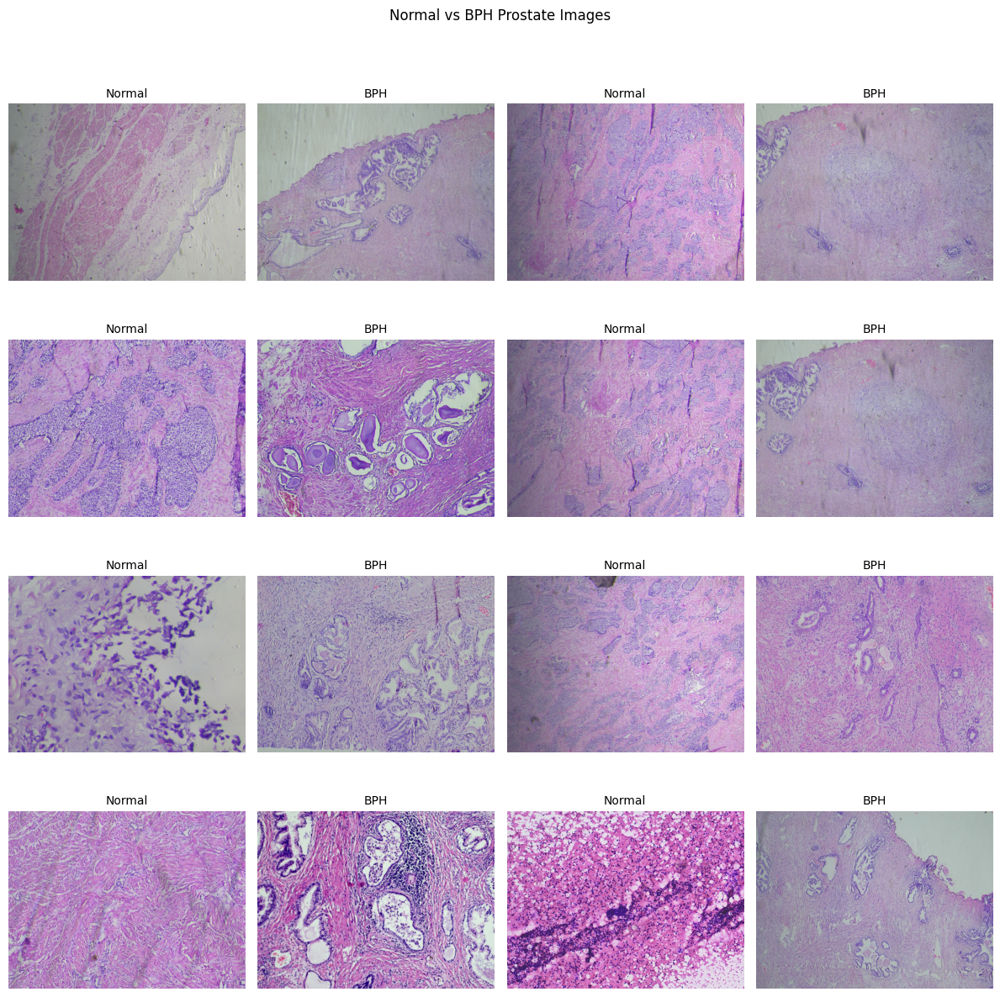

In [6]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random

def plot_combined_images(root_dir, n_images=8, figsize=(12, 12)):
   
    # Get paths for both classes
    class_paths = {
        'Normal': os.path.join(root_dir, "Normal"),
        'BPH': os.path.join(root_dir, "BPH")
    }
    
    # Collect images from both classes
    class_images = {}
    for class_name, path in class_paths.items():
        images = []
        for f in os.listdir(path):
            if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                images.append(os.path.join(path, f))
        class_images[class_name] = random.sample(images, min(n_images, len(images))) 
    
    # Create figure
    plt.figure(figsize=figsize)
    
    # Plot images - alternating between classes
    for i in range(n_images*2):
        plt.subplot(4, 4, i+1)  # 4x4 grid
        
        # Alternate between classes
        class_name = 'Normal' if i % 2 == 0 else 'BPH'
        img_idx = i // 2
        
        if img_idx < len(class_images[class_name]):
            try:
                img = Image.open(class_images[class_name][img_idx])
                plt.imshow(img)
                plt.title(class_name, fontsize=10)
            except Exception as e:
                plt.imshow(np.zeros((100, 100, 3)))
                plt.title(f"Error", fontsize=8, color='red')
        else:
            plt.imshow(np.zeros((100, 100, 3)))
            plt.title("No image", fontsize=8, color='gray')
            
        plt.axis('off')
    
    plt.suptitle("Normal vs BPH Prostate Images", y=1.02, fontsize=12)
    plt.tight_layout()
    plt.savefig('/kaggle/working/combined_images.png', dpi=300, bbox_inches='tight')
    plt.show()

# Path to your dataset
root_path = "/kaggle/input/benign-prostate-hyperplasiabph-detection/Hyperplasia Analysis"

# Plot combined images
plot_combined_images(root_path)

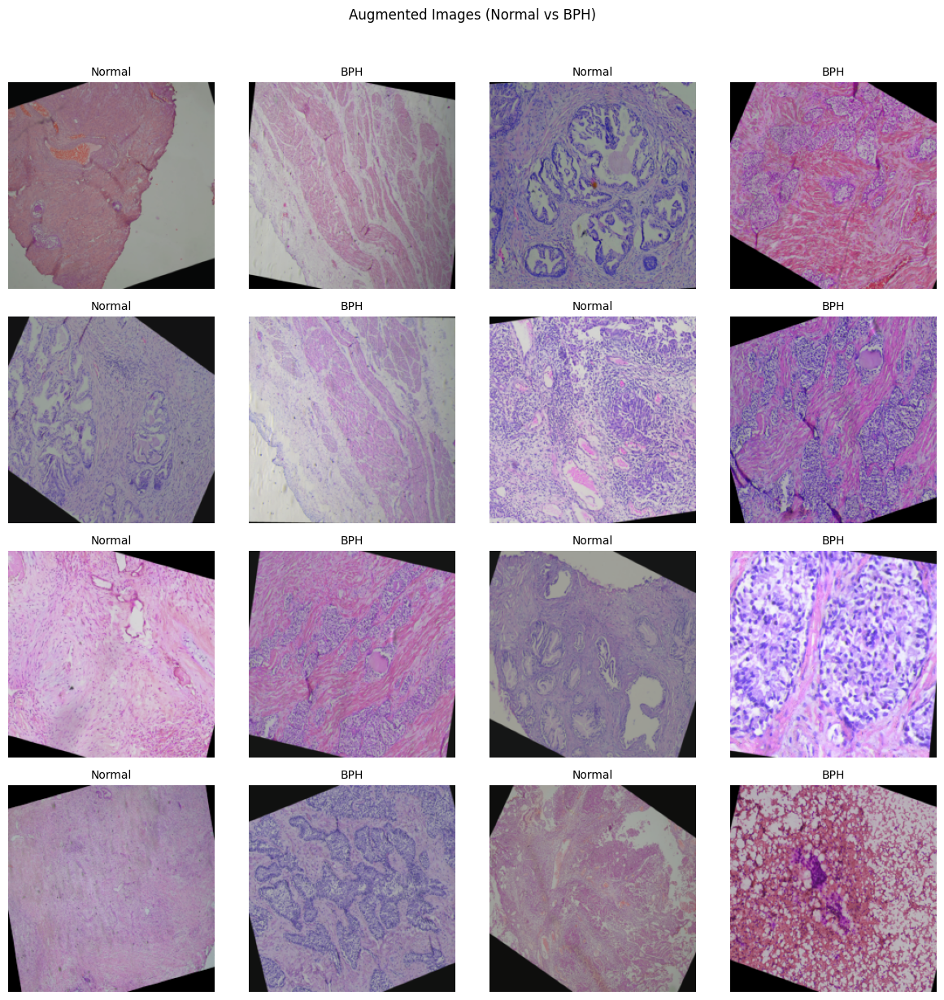

In [7]:
import os
import matplotlib.pyplot as plt
import numpy as np
import random
from torchvision import transforms as T

def plot_augmented_images(dataset, n_images=8, figsize=(12, 12)):
  
    # Collect augmented samples
    normal_samples = []
    bph_samples = []
    
    for i in range(len(dataset)):
        img, label = dataset[i]
        if label == 0 and len(normal_samples) < n_images:  # Assuming 0=Normal
            normal_samples.append(img)
        elif label == 1 and len(bph_samples) < n_images:  # Assuming 1=BPH
            bph_samples.append(img)
        if len(normal_samples) >= n_images and len(bph_samples) >= n_images:
            break
    
    # Create figure
    plt.figure(figsize=figsize)
    
    # Denormalize transform
    denormalize = T.Compose([
        T.Normalize(mean=[0., 0., 0.], std=[1/0.229, 1/0.224, 1/0.225]),
        T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.])
    ])
    
    # Plot images - alternating between classes
    for i in range(n_images*2):
        plt.subplot(4, 4, i+1)  # 4x4 grid
        
        # Alternate between classes
        if i % 2 == 0:  # Normal
            if i//2 < len(normal_samples):
                img = denormalize(normal_samples[i//2]).permute(1, 2, 0).numpy()
                plt.imshow(np.clip(img, 0, 1))
                plt.title("Normal", fontsize=10)
        else:  # BPH
            if i//2 < len(bph_samples):
                img = denormalize(bph_samples[i//2]).permute(1, 2, 0).numpy()
                plt.imshow(np.clip(img, 0, 1))
                plt.title("BPH", fontsize=10)
        
        plt.axis('off')
    
    plt.suptitle("Augmented Images (Normal vs BPH)", y=1.02, fontsize=12)
    plt.tight_layout()
    plt.savefig('/kaggle/working/augmented_images.png', dpi=300, bbox_inches='tight')
    plt.show()

# Usage with your augmented dataset
plot_augmented_images(tr_ds)  # Assuming tr_ds is your training dataset with augmentations

In [8]:
import os
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm
from torchvision import models
from torchvision.models import ResNet18_Weights
from sklearn.svm import SVC
import joblib

# Setup
device = "cuda" if torch.cuda.is_available() else "cpu"
save_dir = "/kaggle/working/saved_models"
os.makedirs(save_dir, exist_ok=True)

# Feature extractor
class FeatureExtractor(torch.nn.Module):
    def __init__(self):
        super().__init__()
        cnn = models.resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        self.features = torch.nn.Sequential(*list(cnn.children())[:-1])
    
    def forward(self, x):
        x = self.features(x)
        return x.view(x.size(0), -1)

feature_extractor = FeatureExtractor().to(device)
feature_extractor.eval()

def extract_features(dataloader):
    feats, labels = [], []
    with torch.no_grad():
        for imgs, gts in tqdm(dataloader):
            imgs = imgs.to(device)
            out = feature_extractor(imgs)
            feats.append(out.cpu().numpy())
            labels.append(gts.numpy())
    return np.vstack(feats), np.hstack(labels)

# Extract features
tr_feats, tr_labels = extract_features(tr_dl)
val_feats, val_labels = extract_features(val_dl)
ts_feats, ts_labels = extract_features(ts_dl)

# Train SVM
train_acc, val_acc = [], []
train_losses, val_losses = [], []
svm = SVC(kernel='rbf', probability=True)

for epoch in range(25):
    subset_size = (epoch + 1) / 25
    n_samples = int(subset_size * len(tr_feats))
    indices = np.random.choice(len(tr_feats), n_samples, replace=False)
    
    svm.fit(tr_feats[indices], tr_labels[indices])
    
    # Calculate metrics
    train_probs = np.clip(svm.predict_proba(tr_feats[indices]), 1e-15, 1-1e-15)
    val_probs = np.clip(svm.predict_proba(val_feats), 1e-15, 1-1e-15)
    
    train_loss = -np.mean(np.log(train_probs[np.arange(n_samples), tr_labels[indices]]))
    val_loss = -np.mean(np.log(val_probs[np.arange(len(val_labels)), val_labels]))
    
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_acc.append(svm.score(tr_feats[indices], tr_labels[indices]))
    val_acc.append(svm.score(val_feats, val_labels))
    
    print(f"Epoch {epoch+1}/25 | Loss: {train_loss:.4f}/{val_loss:.4f} | Acc: {train_acc[-1]:.4f}/{val_acc[-1]:.4f}")

joblib.dump(svm, f"{save_dir}/svm_model.pkl")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 107MB/s]
100%|██████████| 200/200 [00:12<00:00, 15.87it/s]


Epoch 1/25 | Loss: 0.1344/0.3471 | Acc: 0.9688/0.8550
Epoch 2/25 | Loss: 0.1394/0.2322 | Acc: 0.9453/0.9100
Epoch 3/25 | Loss: 0.0901/0.1587 | Acc: 0.9740/0.9400
Epoch 4/25 | Loss: 0.0655/0.1362 | Acc: 0.9844/0.9400
Epoch 5/25 | Loss: 0.0995/0.1291 | Acc: 0.9531/0.9650
Epoch 6/25 | Loss: 0.0557/0.1263 | Acc: 0.9870/0.9600
Epoch 7/25 | Loss: 0.0432/0.0917 | Acc: 0.9911/0.9650
Epoch 8/25 | Loss: 0.0367/0.0794 | Acc: 0.9844/0.9650
Epoch 9/25 | Loss: 0.0504/0.0945 | Acc: 0.9774/0.9650
Epoch 10/25 | Loss: 0.0359/0.0640 | Acc: 0.9875/0.9750
Epoch 11/25 | Loss: 0.0441/0.0617 | Acc: 0.9858/0.9700
Epoch 12/25 | Loss: 0.0401/0.0711 | Acc: 0.9896/0.9700
Epoch 13/25 | Loss: 0.0347/0.0538 | Acc: 0.9880/0.9750
Epoch 14/25 | Loss: 0.0284/0.0533 | Acc: 0.9933/0.9700
Epoch 15/25 | Loss: 0.0343/0.0485 | Acc: 0.9885/0.9750
Epoch 16/25 | Loss: 0.0248/0.0544 | Acc: 0.9922/0.9800
Epoch 17/25 | Loss: 0.0370/0.0575 | Acc: 0.9890/0.9800
Epoch 18/25 | Loss: 0.0299/0.0400 | Acc: 0.9887/0.9800
Epoch 19/25 | Loss:

['/kaggle/working/saved_models/svm_model.pkl']

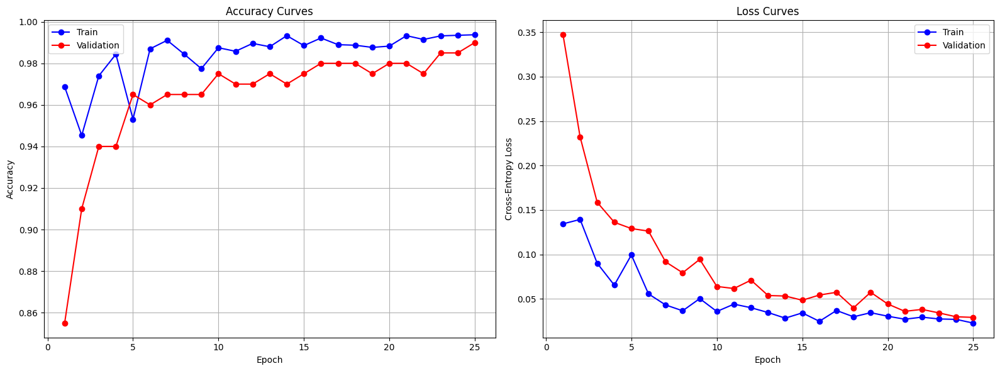

In [9]:
import matplotlib.pyplot as plt

# Save metrics
metrics_df = pd.DataFrame({
    'Epoch': range(1, 26),
    'Train_Accuracy': train_acc,
    'Val_Accuracy': val_acc,
    'Train_Loss': train_losses,
    'Val_Loss': val_losses
})
metrics_df.to_excel("/kaggle/working/training_metrics.xlsx", index=False)

# Plot curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy plot
ax1.plot(metrics_df['Epoch'], metrics_df['Train_Accuracy'], 'b-o', label='Train')
ax1.plot(metrics_df['Epoch'], metrics_df['Val_Accuracy'], 'r-o', label='Validation')
ax1.set_title('Accuracy Curves')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True)

# Loss plot
ax2.plot(metrics_df['Epoch'], metrics_df['Train_Loss'], 'b-o', label='Train')
ax2.plot(metrics_df['Epoch'], metrics_df['Val_Loss'], 'r-o', label='Validation')
ax2.set_title('Loss Curves')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Cross-Entropy Loss')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.savefig("/kaggle/working/training_curves.png", dpi=300, bbox_inches='tight')
plt.show()

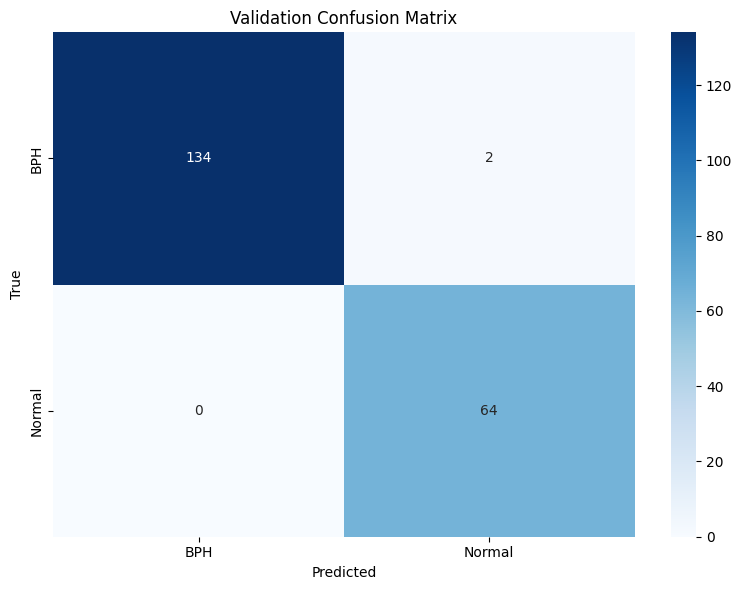

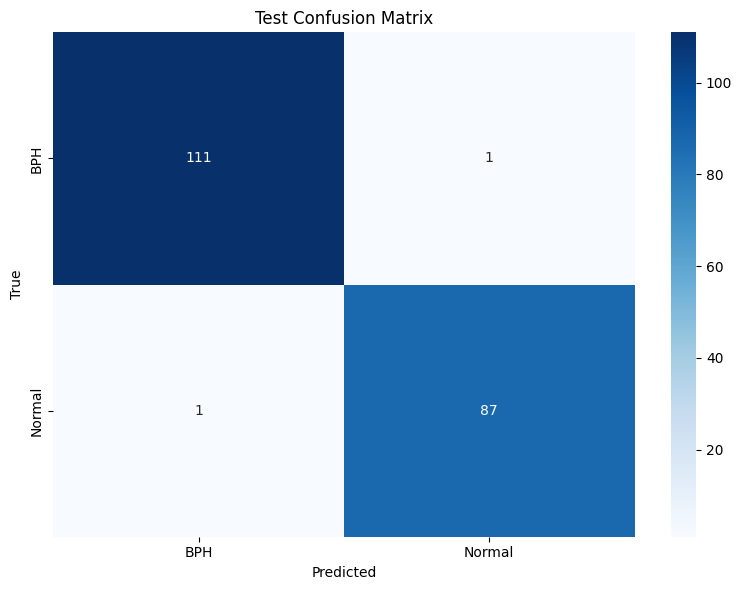

In [10]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Load model
svm = joblib.load(f"{save_dir}/svm_model.pkl")

# Predictions
val_pred = svm.predict(val_feats)
ts_pred = svm.predict(ts_feats)

# Confusion matrices
def plot_confusion_matrix(true, pred, title, filename):
    cm = confusion_matrix(true, pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=classes.keys(), 
                yticklabels=classes.keys())
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

plot_confusion_matrix(val_labels, val_pred, 
                     "Validation Confusion Matrix", 
                     "/kaggle/working/val_confusion_matrix.png")

plot_confusion_matrix(ts_labels, ts_pred, 
                     "Test Confusion Matrix", 
                     "/kaggle/working/test_confusion_matrix.png")

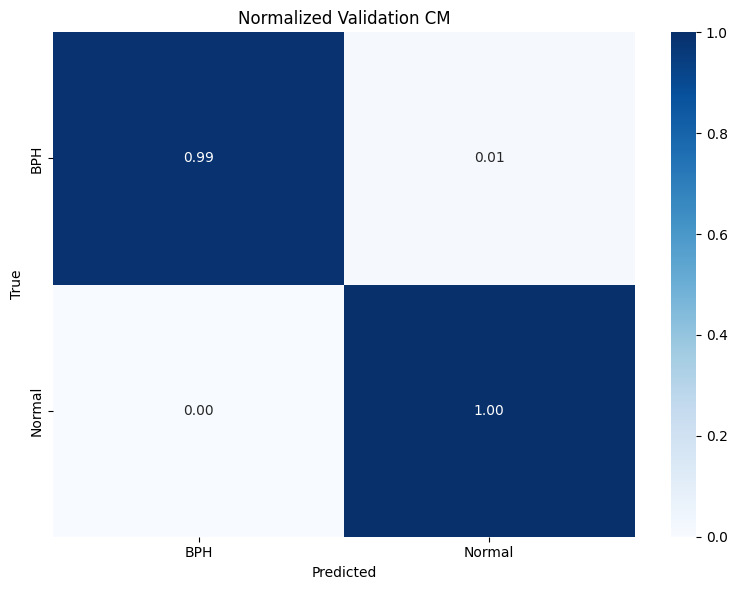

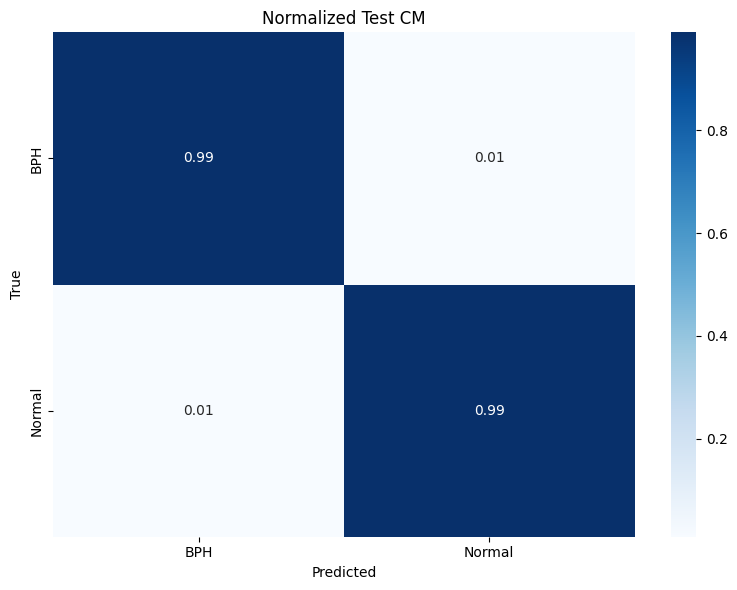

In [11]:
def plot_normalized_cm(true, pred, title, filename):
    cm = confusion_matrix(true, pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=classes.keys(),
                yticklabels=classes.keys())
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.show()

plot_normalized_cm(val_labels, val_pred,
                  "Normalized Validation CM",
                  "/kaggle/working/val_confusion_matrix_norm.png")

plot_normalized_cm(ts_labels, ts_pred,
                  "Normalized Test CM",
                  "/kaggle/working/test_confusion_matrix_norm.png")

In [12]:
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

def print_metrics(y_true, y_pred, set_name):
    print(f"\n{'='*40}")
    print(f"{set_name.upper()} SET METRICS")
    print('='*40)
    print(f"Accuracy: {np.mean(y_pred == y_true):.4f}")
    print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted'):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='weighted'):.4f}")
    print(f"Recall: {recall_score(y_true, y_pred, average='weighted'):.4f}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=classes.keys()))

# Save all metrics to Excel
metrics = {
    'Validation': {
        'Accuracy': np.mean(val_pred == val_labels),
        'F1': f1_score(val_labels, val_pred, average='weighted'),
        'Precision': precision_score(val_labels, val_pred, average='weighted'),
        'Recall': recall_score(val_labels, val_pred, average='weighted')
    },
    'Test': {
        'Accuracy': np.mean(ts_pred == ts_labels),
        'F1': f1_score(ts_labels, ts_pred, average='weighted'),
        'Precision': precision_score(ts_labels, ts_pred, average='weighted'),
        'Recall': recall_score(ts_labels, ts_pred, average='weighted')
    }
}

pd.DataFrame(metrics).to_excel("/kaggle/working/final_metrics.xlsx")

# Print reports
print_metrics(val_labels, val_pred, "Validation")
print_metrics(ts_labels, ts_pred, "Test")


VALIDATION SET METRICS
Accuracy: 0.9900
F1 Score: 0.9900
Precision: 0.9903
Recall: 0.9900

Classification Report:
              precision    recall  f1-score   support

         BPH       1.00      0.99      0.99       136
      Normal       0.97      1.00      0.98        64

    accuracy                           0.99       200
   macro avg       0.98      0.99      0.99       200
weighted avg       0.99      0.99      0.99       200


TEST SET METRICS
Accuracy: 0.9900
F1 Score: 0.9900
Precision: 0.9900
Recall: 0.9900

Classification Report:
              precision    recall  f1-score   support

         BPH       0.99      0.99      0.99       112
      Normal       0.99      0.99      0.99        88

    accuracy                           0.99       200
   macro avg       0.99      0.99      0.99       200
weighted avg       0.99      0.99      0.99       200



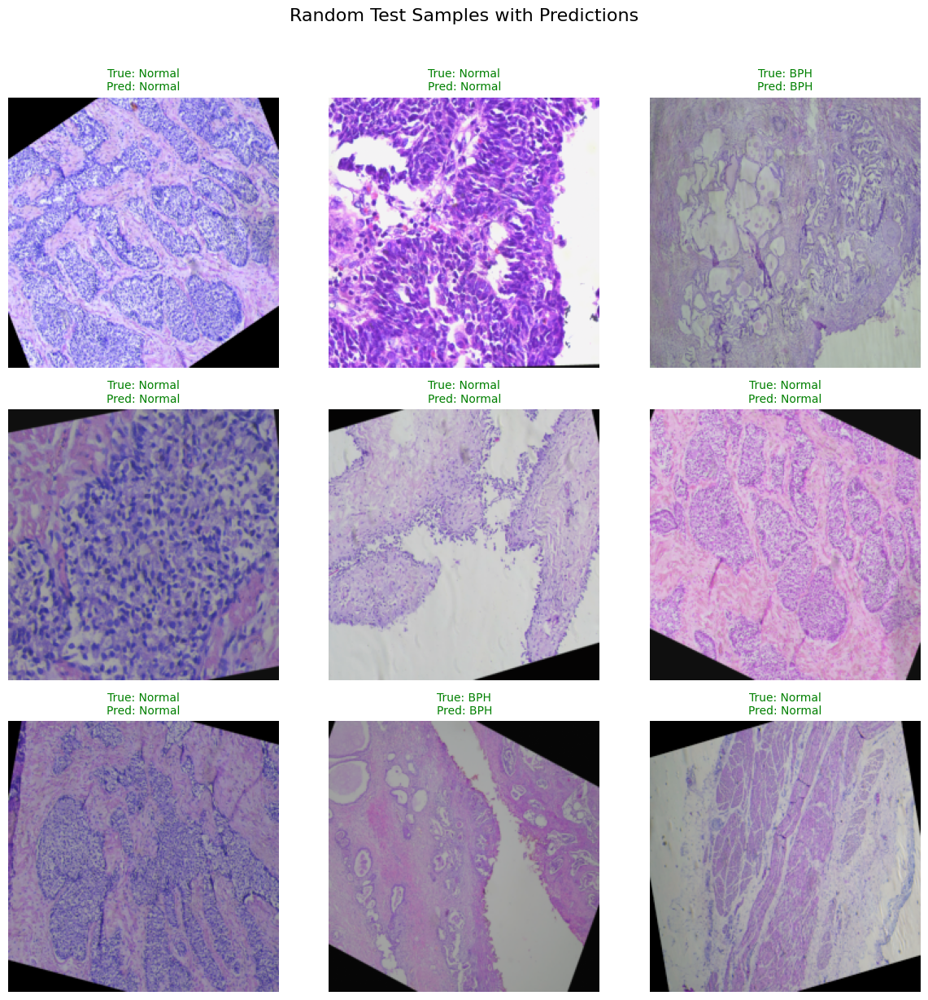

In [13]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from sklearn.svm import SVC

# Define Denormalize class (was missing)
class Denormalize:
    def __init__(self, mean, std):
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)
    
    def __call__(self, tensor):
        return tensor * self.std + self.mean

# Configuration
num_samples = 9  # 3x3 grid
mean = [0.485, 0.456, 0.406]  # ImageNet mean
std = [0.229, 0.224, 0.225]    # ImageNet std
denorm = Denormalize(mean, std)

# Create figure
plt.figure(figsize=(12, 12))

# Select random samples
dataset = ts_dl.dataset
indices = random.sample(range(len(dataset)), num_samples)

for idx, sample_idx in enumerate(indices, 1):
    # Get sample
    img_tensor, true_label = dataset[sample_idx]
    
    # Prepare image for display
    img_np = denorm(img_tensor.clone())
    img_np = img_np.permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np, 0, 1)  # Ensure valid image range
    
    # Make prediction
    with torch.no_grad():
        features = feature_extractor(img_tensor.unsqueeze(0).to(device))
        pred_label = svm.predict(features.cpu().numpy())[0]
    
    # Get class names
    true_class = list(classes.keys())[true_label]
    pred_class = list(classes.keys())[pred_label]
    
    # Create subplot
    plt.subplot(3, 3, idx)
    plt.imshow(img_np)
    plt.title(f"True: {true_class}\nPred: {pred_class}", 
             color='green' if true_label == pred_label else 'red',
             fontsize=10)
    plt.axis('off')

plt.suptitle("Random Test Samples with Predictions", y=1.02, fontsize=16)
plt.tight_layout()
plt.savefig("/kaggle/working/prediction_samples.png", bbox_inches='tight', dpi=300)
plt.show()

In [14]:
# import os
# import shutil

# def clear_kaggle_output():
#     """Clears all files in Kaggle's working directory (/kaggle/working/)"""
#     working_dir = '/kaggle/working/'
    
#     # List all files in the directory
#     files = os.listdir(working_dir)
    
#     if not files:
#         print("Output directory is already empty")
#         return
    
#     print(f"Found {len(files)} files in output directory")
    
#     # Remove each file
#     for file in files:
#         file_path = os.path.join(working_dir, file)
#         try:
#             if os.path.isfile(file_path):
#                 os.unlink(file_path)
#             elif os.path.isdir(file_path):
#                 shutil.rmtree(file_path)
#             print(f"Removed: {file_path}")
#         except Exception as e:
#             print(f"Failed to remove {file_path}. Reason: {e}")
    
#     print("Output directory cleared successfully")

# # Call the function
# clear_kaggle_output()